# Mapping tutorial

The goal of this tutorial is – in a sense – the opposite of the localization tutorial. We consider the following scenario:
* we have a two-dimensional map consisting of walls and free space
* a robot is located at the center of the map (so it knows its position)
* the robot is equipped with a sensor that can (noisily) measure the distance to the nearest wall in several directions
* we want to infer the locations of the walls in the map

As a simplifying assumption, we assume that
* the map is a $21 \times 21$ grid of unit blocks ("pixels")
* each pixel is either a wall or a free space

This tutorial will teach you how to:
* model this scenario in GenJAX
* perform Bayesian inference to infer the walls on the map from noisy sensor measurements:
  * first, via importance sampling (which turns out to perform poorly)
  * then, via Gibbs sampling (which turns out to perform well)

Potential future extensions:
* include observations from several points of view
* include uncertainty in the robot's position
* allow the robot to move around (including uncertainty in the motion)

In [1]:
# Global setup code

import genstudio.plot as Plot
import itertools
import jax
import jax.numpy as jnp
import genjax
from urllib.request import urlopen
from genjax import SelectionBuilder as S
from genjax import ChoiceMapBuilder as C
from genjax import pretty, Target
from genjax.typing import IntArray, FloatArray, PRNGKey
from penzai import pz
from typing import Any, Iterable

import os

pretty()

html = Plot.Hiccup
Plot.configure({"display_as": "html", "dev": False})

# Ensure a location for image generation.
os.makedirs("imgs", exist_ok=True)

## Loading the map

The following functions are useful to load the map from a string (which makes editing the walls by hand easier than the array representation).

In [2]:

GRID = r"""
.....................
.....................
.XXX..........X......
.X.X..........X......
.X............XXX....
.X..............X....
.X..............X....
.XX............XXX...
..X..............X...
..X..............X...
..X..............X...
..X..............X...
..XXXXX......XXXXX...
......X......X.......
......X....XXX.......
......X....X.........
......X....X.........
......XXXXXX.........
.....................
.....................
.....................
"""

GRID_SIZE = 21
CENTER = jnp.array([GRID_SIZE // 2, GRID_SIZE // 2])

def extract_points_from_grid_string(grid_string):
    """Extracts the points from the grid string."""
    lines = grid_string.strip().split("\n")
    height = len(lines)
    width = len(lines[0])
    walls = jnp.zeros((height, width))
    for i, line in enumerate(lines):
        for j, char in enumerate(line):
            if char == "X":
                walls = walls.at[i, j].set(1)
    return walls

true_walls = extract_points_from_grid_string(GRID)

Now, `true_walls` is a 21 x 21 array of 0s and 1s, where 1s indicate the presence of a wall.
Similarly, `true_pixels` contains the coordinates of all `21 * 21 = 441` pixels and the presence of a wall.

## Plotting

In order to understand the problem, our code, and for debugging, it is useful to have visualizations.
Hence we define the following functions to plot the map.

In [3]:
OFFSETS = jnp.array([
    [-0.5, -0.5],
    [0.5, -0.5],
    [0.5, 0.5],
    [-0.5, 0.5],
])

OFFSETS_CLOSED = jnp.concat([OFFSETS, OFFSETS[:1]], axis=0)

def plot_walls(walls):
    return [
        Plot.line(jnp.array([[i, j]], dtype=float) + OFFSETS_CLOSED, fill="black", fillOpacity=is_wall)
        for i, row in enumerate(walls)
        for j, is_wall in enumerate(row)
        if is_wall > 0
    ]

def line_segments_of_pixel(pixel: IntArray):
    vertices = pixel[None, :] + OFFSETS
    return jnp.stack([vertices, jnp.roll(vertices, 1, axis=0)], axis=1)

line_segments = jax.vmap(line_segments_of_pixel, in_axes=0)

def make_plot(p):
    return Plot.new(
        p,
        {"width": 500, "aspectRatio": 1},
        Plot.domain([0, GRID_SIZE], [0, GRID_SIZE])
    )

In [4]:
make_plot(plot_walls(true_walls))

## Interactive map

In [5]:
import genstudio.plot as Plot

def on_click(widget, event):
    global click
    x, y = round(event["x"]), round(event["y"])
    click = [x, y]
    widget.state.update({"click": click})
    print(widget.state.click)

click = [0,0]

(Plot.initial_state({"click": [0, 0]}, sync=True)
    + Plot.ellipse([Plot.js("$state.click")], r=1, fill="red")
    + Plot.domain([-10, 10], [-10, 10])
    + Plot.aspectRatio(1)
    + Plot.width(500)
    + Plot.events(
        onClick=on_click, onDraw=on_click
    )
).display_as("widget")

Widget(data=<genstudio.plot_spec.PlotSpec object at 0x354b62b10>)

## Prior

For a Bayesian model, we first need to specify our prior belief about the map.
We will keep it very simple here and assume that each pixel is a wall with probability 0.5.

In [6]:
PRIOR_WALL_PROB = 0.5

walls_prior = genjax.flip.repeat(n=GRID_SIZE).repeat(n=GRID_SIZE)(PRIOR_WALL_PROB)

In order to get a better understanding, let us sample from the prior.
To do this, JAX requires a random seed, called "key", which we pass to the `.simulate` method of the generative function.
The result is a **trace**, which contains the return value of the function, the score, and the choice ("sampled values during execution").
The score is the log probability of the choices.

In [7]:
key = jax.random.key(0)
sample_prior_jitted = jax.jit(walls_prior.simulate)
tr = sample_prior_jitted(key, ())
display(tr.get_score())
display(tr.get_choices())
display(tr.get_retval())

<jax.Array(-305.6776, dtype=float32)>

Choice(v=<jax.Array bool(21, 21) true:218 false:223>)

<jax.Array bool(21, 21) true:218 false:223
  <Arrayviz rendering>
| Device: CPU 0>

Let's visualize the map of pixels that was sampled from the prior.

In [8]:
walls = tr.get_retval()
make_plot(plot_walls(walls))

We can see that, in fact, about half the pixels are walls. So the prior seems to work as intended.

POSSIBLE EXTENSION: However, these maps don't look like real-world maps. The prior could be refined in various ways:
* Probably, less than 50% of the pixels are walls, so the probability could be lowered.
* "Wall pixels" are likely connected, so we could generate line segments in the prior rather than individual pixels.

## Exact sensor model

As mentioned at the start, the robot located at the origin has a sensor to measure the distance to the nearest wall in several directions.
We can model this as follows.
The math in the next cell is standard geometry, but not relevant for the overall understanding of modeling and inference in GenJAX, so feel free to skip the details.

In [9]:
def solve_lines(p, u, q, v, PARALLEL_TOL=1.0e-10):
    """
    Solves for the intersection of two lines defined by points and direction vectors.

    Args:
    - p, u: Point and direction vector defining the first line.
    - q, v: Point and direction vector defining the second line.
    - PARALLEL_TOL: Tolerance for determining if lines are parallel.

    Returns:
    - s, t: Parameters for the line equations at the intersection point.
            Returns [-inf, -inf] if lines are parallel.
    """
    det = u[0] * v[1] - u[1] * v[0]
    return jnp.where(
        jnp.abs(det) < PARALLEL_TOL,
        jnp.array([-jnp.inf, -jnp.inf]),
        jnp.array(
            [
                (v[0] * (p[1] - q[1]) - v[1] * (p[0] - q[0])) / det,
                (u[1] * (q[0] - p[0]) - u[0] * (q[1] - p[1])) / det,
            ]
        ),
    )


def distance(pos, dir, seg):
    """
    Computes the distance from the origin to a segment, in a given direction.

    Args:
    - dir: The direction: `[dir_x, dir_y]`.
    - seg: The Segment object: `[[start_x, start_y], [end_x, end_y]]`.

    Returns:
    - float: The distance to the segment. Returns infinity if no valid intersection is found.
    """
    a = solve_lines(pos, dir, seg[0], seg[1] - seg[0])
    return jnp.where(
        (a[0] >= 0.0) & (a[1] >= 0.0) & (a[1] <= 1.0),
        a[0],
        jnp.inf,
    )

def unit_dir(angle):
    """Unit vector in the direction of `angle`."""
    return jnp.array([jnp.cos(angle), jnp.sin(angle)])

The robot's sensor can measure the distance in `NUM_DIRECTIONS` equidistant directions.

The following code computes the sensor readings.
It makes use of the JAX functions `jax.lax.cond` (instead of `if`) and `jax.vmap` (instead of a for-loop) because we want JAX to JIT-compile and vectorize these operations.

In [10]:
NUM_DIRECTIONS = 50
ANGLES = jnp.arange(0, 1, 1 / NUM_DIRECTIONS) * 2 * jnp.pi
MAX_DISTANCE = GRID_SIZE * 2

def distance_to_pixel(pos, dir, coord, wall):
    """Distance from the origin to the pixel at `coord` if the ray in direction `dir` hits the pixel and it is a wall."""
    segs = line_segments_of_pixel(coord)
    dists = jax.vmap(lambda seg: distance(pos, dir, seg))(segs)
    return jax.lax.cond(
        wall > 0,
        lambda: jax.lax.cond(
            jnp.array_equal(coord, jnp.array([0, 0])),
            lambda: 0.0, # we are inside the wall
            lambda: jnp.min(dists, axis=0),
        ),
        lambda: jnp.inf
    )

def distance_to_pixels(pos, dir, walls):
    """Distance from the origin to the nearest wall among `pixels` in direction `dir`.
    
    The distance is capped at `MAX_DISTANCE` to avoid infinities in the calculations."""
    return jnp.minimum(
        jnp.min(
            jax.vmap(
                lambda i, row: jax.vmap(
                    lambda j, is_wall: distance_to_pixel(pos, dir, jnp.array([i, j]), is_wall)
                )(jnp.arange(walls.shape[1]), row)
            )(jnp.arange(walls.shape[0]), walls)
        ),
        MAX_DISTANCE
    )

def sensor_distances(pos, pixels):
    """Sensor distances in all directions (as specified by `ANGLES`) for the map given by `pixels`."""
    return jax.vmap(lambda angle: distance_to_pixels(pos, unit_dir(angle), pixels))(ANGLES)

As before, it is useful to have visualizations.

In [11]:
def plot_sensors(pos, readings):
    """Plot the sensor readings."""
    unit_vecs = jax.vmap(unit_dir, in_axes=0)(ANGLES)
    ray_endpoints = unit_vecs * readings[:, None]
    return [
        Plot.line([pos, pos + endpoint], stroke=Plot.constantly("sensor rays"))
        for endpoint in ray_endpoints
    ] + [
        Plot.ellipse([pos + endpoint], r=0.1, fill=Plot.constantly("sensor readings"))
        for endpoint in ray_endpoints
    ] + Plot.ellipse([pos], r=0.2, fill="red")

def world_and_sensors_plot(pos, walls, readings):
    return plot_walls(walls) + plot_sensors(pos, readings)

true_readings = sensor_distances(CENTER, true_walls)

make_plot(world_and_sensors_plot(CENTER, true_walls, true_readings))

## Noisy sensor model

A real sensor is going to be noisy, which we model with a normal distribution.
As before, we specify the model for a single direction/angle first, and then map it over all directions.

In [12]:
NOISE = 0.5

@genjax.gen
def sensor_model_single(pos, pixels, angle):
    exact_distance = distance_to_pixels(pos, unit_dir(angle), pixels)
    return genjax.normal(exact_distance, NOISE) @ ()

sensor_model = sensor_model_single.vmap(in_axes=(None, None, 0))

Let's sample from the sensor model to see what data the robot receives.
We can see that the sensor readings are no longer exact, but contain quite a bit of noise.
The noise level can be controlled by changing the `NOISE` variable above.

In [13]:
key = jax.random.key(0)
trace = sensor_model.simulate(key, (CENTER, true_walls, ANGLES,))
observed_readings = trace.get_retval()
make_plot(world_and_sensors_plot(CENTER, true_walls, observed_readings))

To get an idea of what the robot sees, let's remove the walls. How can we infer the walls?

In [14]:
make_plot(plot_sensors(CENTER, observed_readings))

## Full model

Now, we can put the pieces together by combining the prior and the sensor model.

In [15]:
@genjax.gen
def full_model(pos):
    walls = walls_prior @ "walls"
    readings = sensor_model(pos, walls, ANGLES) @ "readings"
    return (walls, readings)

This model samples a map from the prior and then samples sensor readings from the sensor model.
The samples are given the addresses `"walls"` and `"readings"`.
When inspecting the trace, we can see that the sampled values are stored under these addresses.

In [16]:
key = jax.random.key(1)
trace = full_model.simulate(key, (CENTER,))
walls, readings = trace.get_retval()
make_plot(world_and_sensors_plot(CENTER, walls, readings))
trace.get_choices()

Static({
  'readings': Choice(
    v=<jax.Array float32(50,) ≈-0.08 ±0.56 [≥-1.9, ≤1.1] nonzero:50
      <Arrayviz rendering>
    | Device: CPU 0>,
  ),
  'walls': Choice(v=<jax.Array bool(21, 21) true:224 false:217>),
})

## Importance sampling (self-normalized importance sampling)

One of the simplest inference methods is importance sampling.
To do this, we constrain our model to the observed data.
For samples corresponding to observations (i.e. the sensor readings), we don't actually sample, but instead use the observed value and record the likelihood of seeing that observation.
GenJAX provides a method for this: `model.importance(key, constraints, args)` runs the model with the random seed `key` and arguments `args`, but constrains the sampled values to `constraints` (the observations).
It returns a trace with the sampled values and a log weight $\log p(observations \mid pixels)$.

If we run `.importance` several times, some traces (with a better prior sample) will have a higher weight and others (with a worse prior choice) will have lower weight.
Suppose these weighted samples are $(pixels_i, \log(w_i))$ for $i = 1 \ldots N$.
We can **normalize** them as follows: $w'_i := \frac{w_i}{\sum_{i} w_i}$.
Then posterior expected values can be approximated using the weighted samples: $\mathbb{E}_{pixels \sim p(pixels \mid readings)} [f(pixels)] \approx \sum_{i=1}^N w'_i f(pixels_i)$.

We can also obtain unweighted samples approximating the posterior by **resampling**: sampling from a categorical distribution where each category $pixels_i$ has $w'_i$.

Let's try this.

In [17]:
def importance_sampling(key, pos, observed_readings, N = 100):
    """Very naive MAP estimation. Just try N random samples and take the one with the highest weight."""
    model_importance = jax.jit(full_model.importance)
    keys = jax.random.split(key, N)
    constraints = C["readings"].set(observed_readings)
    traces, log_weights = jax.vmap(lambda key: model_importance(key, constraints, (pos,)))(keys)
    log_weights = log_weights - jax.scipy.special.logsumexp(log_weights)
    return traces, log_weights

key, subkey = jax.random.split(jax.random.key(0))
traces, log_weights = importance_sampling(subkey, CENTER, observed_readings, N=100000)
subkeys = jax.random.split(subkey, 100)
resampled_indices = jax.vmap(lambda i: jax.random.categorical(subkeys[i], log_weights))(jnp.arange(100))
resampled_indices

<jax.Array int32(100,) [≥12_110, ≤12_110] nonzero:100
  <Arrayviz rendering>
| Device: CPU 0>

If we look at the resampled indices, we see that they are all the same.
What this means is that one trace had such a high weight that none of the other traces had a chance to be resampled.
This makes sense, because it is extremely unlikely to guess a "good" map just by sampling from the prior.
So one (bad) sample will get lucky and have a high weight by chance and be selected every time.
We can confirm this by looking at a histogram of the weights.

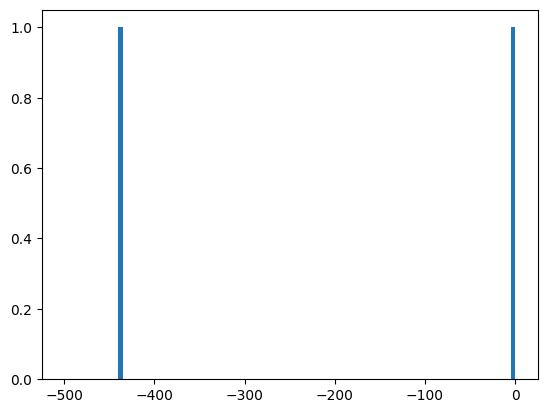

In [18]:
import matplotlib.pyplot as plt
plt.hist(log_weights, bins=100, range=(-500, 0))
plt.show()

As we can see, the next best trace has a **log** weight of less than -20, orders of magnitude worse than the best sample.

This is clearly bad. We need better inference methods.

## Automated importance sampling with prior proposal

GenJAX has automation for importance sampling.

TODO: `ImportanceK` gives weird results. I'm not sure what's going wrong here.

In [19]:
from genjax.inference.smc import ImportanceK
num_samples = 100
constraints = C["readings"].set(observed_readings)
target = Target(full_model, (CENTER,), constraints)
alg = ImportanceK(target, k_particles=num_samples)
key, *subkeys = jax.random.split(key, num_samples + 1)
subkeys = jnp.array(subkeys)
posterior_samples = jax.jit(jax.vmap(alg(target)))(subkeys)
walls = jnp.mean(posterior_samples["walls"], axis=0)
make_plot(world_and_sensors_plot(CENTER, walls, observed_readings))

## Simple Gibbs sampling

As a better inference algorithm, we turn to Gibbs sampling.
Gibbs sampling is a simple algorithm to sample from a joint distribution $p(x_1, \dots, x_n)$, assuming one can sample from the conditional distributions $p(x_i \mid x_1, \dots, x_{i-1}, x_{i+1}, \dots, x_n)$.
A Gibbs starts with initial values $x_1^{(0)}, \dots, x_n^{(0)}$ and then iteratively updates each $x_i$ from the conditional distribution $p(x_i \mid x_1^{(t)}, \dots, x_{i-1}^{(t)}, x_{i+1}^{(t - 1)}, \dots, x_n^{(t - 1)})$ until convergence.

In our case, the $x_i$'s are the pixels.
We can sample from $p(x_i \mid x_1, \dots, x_{i-1}, x_{i+1}, \dots, x_n) = \frac{p(x_1, \dots, x_n)}{p(x_1, \dots, x_{i-1}, 0, x_{i+1}, \dots, x_n) + p(x_1, \dots, x_{i-1}, 1, x_{i+1}, \dots, x_n)}$ by enumeration: evaluating the joint density at $x_i = 0$ and $x_i = 1$ (free space or wall).
To evaluate the density, GenJAX provides the method `model.assess(choice_map, args)`, which runs the model with all samples constrained to `choice_map` and returns the likelihood.

TODO: it would probably be better to use `update` or `edit` here? Not sure how exactly yet.

TODO: is there a more idiomatic way to write Gibbs? Should the proposal be a @genjax.gen model?

In [20]:
full_model_assess = jax.jit(full_model.assess)

def gibbs_update_pixel(key, pos, readings, walls, i, j):
    is_wall_false = walls.at[i, j].set(0)
    is_wall_true = walls.at[i, j].set(1)
    chm_false = C["readings"].set(readings) ^ C["walls"].set(is_wall_false)
    (false_weight, _) = full_model_assess(chm_false, (pos,))
    chm_true = C["readings"].set(readings) ^ C["walls"].set(is_wall_true)
    (true_weight, _) = full_model_assess(chm_true, (pos,))
    # categorical automatically normalizes the weights
    pixel_is_wall = genjax.categorical.sample(key, jnp.array([false_weight, true_weight])).astype(jnp.float32)
    return pixel_is_wall

def simple_gibbs_sweep(key, pos, readings, walls):
    subkeys = jax.random.split(key, walls.shape)
    walls = jax.lax.fori_loop(
        0,
        walls.shape[0],
        lambda i, walls: jax.lax.fori_loop(
            0,
            walls.shape[1],
            lambda j, walls: walls.at[i, j].set(gibbs_update_pixel(subkeys[i, j], pos, readings, walls, i, j)),
            walls
        ),
        walls
    )
    return walls

Starting from any map, applying Gibbs sweeps will (under certain conditions) yield approximate samples from the posterior distribution.
Let's try this out.

In [21]:
def run_gibbs_chain(key, gibbs_update, pos, readings, num_samples=100):
    walls = jnp.zeros((GRID_SIZE, GRID_SIZE))
    key = jax.random.key(1)
    key, *subkeys = jax.random.split(key, num_samples + 1)
    subkeys = jnp.array(subkeys)
    gibbs_update_jitted = jax.jit(gibbs_update)
    _, gibbs_chain = jax.lax.scan(lambda walls, key: (gibbs_update_jitted(key, pos, readings, walls), walls), walls, subkeys)
    return gibbs_chain
gibbs_chain = run_gibbs_chain(jax.random.key(0), simple_gibbs_sweep, CENTER, observed_readings)

In [22]:
def plot_ground_truth_walls(walls):
    return [
        Plot.line(jnp.array([[i, j]]) + OFFSETS_CLOSED, stroke="green", strokeWidth=3)
        for i, row in enumerate(walls)
        for j, is_wall in enumerate(row)
        if is_wall > 0
    ]

ground_truth_plot = plot_ground_truth_walls(true_walls)
sensors_plot = plot_sensors(CENTER, observed_readings)

Use the slider at the bottom of the first plot to visualize the iterations of the Gibbs sampler.
The second plot averages over the chain and gives an idea of how likely each pixel is to be a wall.

In [23]:
num_frames = 100
thinning = gibbs_chain.shape[0] // num_frames
animation = Plot.Frames([
    make_plot(plot_walls(sample) + sensors_plot + ground_truth_plot)
    for sample in gibbs_chain[::thinning]
])
display(animation)
plot = make_plot(plot_walls(jnp.mean(gibbs_chain, axis=0)) + sensors_plot + ground_truth_plot)
display(plot)

We can see that it takes about 10 iterations before all the walls at the bottom are removed.

## Better variable order for Gibbs sampling

We can make Gibbs sampling converge faster by updating pixels in a different order.
Note that if a pixel near the origin is a wall, it casts a "shadow" and all the pixels in its shadow are irrelevant (and thus sampled from the prior as fair coin flips).
If the pixel near the origin flips and becomes free space, all the pixels in its shadow are suddenly "visible", but will be randomly initialized.

For this reason it is better to update the pixels from the center outwards.
This way, the pixels in the center are updated **before** the pixels in their shadow, so the pixels in the shadow can be updated in the same sweep.
Specifically, we first update the pixels according to their distance to the origin.
First, the origin itself, then the "diamond" around it, then the next layer etc.

In [24]:
def smarter_gibbs_update_distance(key, pos, readings, walls, distance):
    subkeys = jax.random.split(key, (GRID_SIZE, GRID_SIZE))
    updated_walls = jax.lax.fori_loop(
        0,
        GRID_SIZE,
        lambda i, walls: jax.lax.fori_loop(
            0,
            GRID_SIZE,
            lambda j, walls: walls.at[i, j].set(
                jax.lax.cond(
                    jnp.sum(jnp.abs(jnp.array([i, j]) - pos)) == distance,
                    lambda: gibbs_update_pixel(subkeys[i, j], pos, readings, walls, i, j),
                    lambda: walls[i, j]
                )
            ),
            walls
        ),
        walls
    )
    return updated_walls

def smarter_gibbs_update(key, pos, readings, walls):
    subkeys = jax.random.split(key, 2 * GRID_SIZE)
    walls = jax.lax.fori_loop(
        0,
        2 * GRID_SIZE,
        lambda distance, walls: smarter_gibbs_update_distance(subkeys[distance], pos, readings, walls, distance),
        walls
    )
    return walls

In [25]:
gibbs_chain = run_gibbs_chain(jax.random.key(0), smarter_gibbs_update, CENTER, observed_readings)

In [26]:
ground_truth_plot = plot_ground_truth_walls(true_walls)
sensors_plot = plot_sensors(CENTER, observed_readings)
animation = Plot.Frames([
    make_plot(plot_walls(sample) + ground_truth_plot + sensors_plot)
    for sample in gibbs_chain
])
display(animation)
plot = make_plot(plot_walls(jnp.mean(gibbs_chain, axis=0)) + ground_truth_plot + sensors_plot)
display(plot)

Here it only takes 2 iterations before all the walls at the bottom are (correctly) removed.

## Block Gibbs sampling (NOT READY FOR REVIEW)

TODO: discuss other optimization: block Gibbs for pixels with the same L_infinity distance to the origin.

In [27]:
def block_gibbs_update_distance(key, pos, readings, walls, distance):
    subkeys = jax.random.split(key, walls.shape)
    pixel_is_wall = jax.vmap(
        lambda subkeys, i: jax.vmap(
            lambda key, j:jax.lax.cond(
                jnp.sum(jnp.abs(jnp.array([i, j]) - pos)) == distance,
                lambda: gibbs_update_pixel(key, pos, readings, walls, i, j),
                lambda: walls[i, j]
            )
        )(subkeys, jnp.arange(walls.shape[1]))
    )(subkeys, jnp.arange(walls.shape[0]))
    return pixel_is_wall

def block_gibbs_update(key, pos, readings, walls):
    walls = jax.lax.fori_loop(0, 2 * GRID_SIZE, lambda distance, walls: block_gibbs_update_distance(key, pos, readings, walls, distance), walls)
    return walls

In [28]:
gibbs_chain = run_gibbs_chain(jax.random.key(0), block_gibbs_update, CENTER, observed_readings)

In [29]:
ground_truth_plot = plot_ground_truth_walls(true_walls)
sensors_plot = plot_sensors(CENTER, observed_readings)
animation = Plot.Frames([
    make_plot(plot_walls(sample) + ground_truth_plot + sensors_plot)
    for sample in gibbs_chain
])
display(animation)
plot = make_plot(plot_walls(jnp.mean(gibbs_chain, axis=0)) + ground_truth_plot + sensors_plot)
display(plot)

KeyboardInterrupt: 

Here it only takes 3 iterations before all the walls at the bottom are (correctly) removed.

TODO: is it OK to parallelize Gibbs in this way?